In [1]:
import cv2
import math
import os
import glob
import random
import time
import mediapipe as mp
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

%matplotlib inline

# Initialize Mediapipe pose
mp_pose = mp.solutions.pose
pose = mp_pose.Pose(
    static_image_mode=True,
    model_complexity=2,
    enable_segmentation=False,
    min_detection_confidence=0.5
)

# Parameters
images_folder = r"C:\Users\Danie\OneDrive\Desktop\squat images"  # Update path
KNEE_ANGLE_THRESHOLD = 100
NUM_SAMPLE_FRAMES = 50
ANNOTATED_RESULTS_FOLDER = os.path.join(images_folder, "annotated_results_feedback")

if not os.path.exists(ANNOTATED_RESULTS_FOLDER):
    os.makedirs(ANNOTATED_RESULTS_FOLDER)


In [2]:
def angle_between_points(a, b, c):
    # a, b, c are (x, y)
    ba = (a[0] - b[0], a[1] - b[1])
    bc = (c[0] - b[0], c[1] - b[1])
    dot_product = ba[0]*bc[0] + ba[1]*bc[1]
    magnitude_ba = math.sqrt(ba[0]**2 + ba[1]**2)
    magnitude_bc = math.sqrt(bc[0]**2 + bc[1]**2)
    if magnitude_ba == 0 or magnitude_bc == 0:
        return 0
    angle_radians = math.acos(dot_product / (magnitude_ba * magnitude_bc))
    angle_degrees = math.degrees(angle_radians)
    return angle_degrees

def is_squatting(landmarks, threshold=KNEE_ANGLE_THRESHOLD):
    # Using left knee angle as a proxy for depth
    l_hip = (landmarks[23]['x'], landmarks[23]['y'])
    l_knee = (landmarks[25]['x'], landmarks[25]['y'])
    l_ankle = (landmarks[27]['x'], landmarks[27]['y'])
    knee_angle = angle_between_points(l_hip, l_knee, l_ankle)
    return knee_angle < threshold, knee_angle


In [3]:
def torso_angle(landmarks):
    # For torso angle, consider angle at the hip formed by shoulder and knee.
    # LEFT_SHOULDER = 11, LEFT_HIP = 23, LEFT_KNEE = 25
    l_shoulder = (landmarks[11]['x'], landmarks[11]['y'])
    l_hip = (landmarks[23]['x'], landmarks[23]['y'])
    l_knee = (landmarks[25]['x'], landmarks[25]['y'])

    # Angle at the hip
    return angle_between_points(l_shoulder, l_hip, l_knee)

def give_feedback(landmarks, knee_angle, threshold=KNEE_ANGLE_THRESHOLD):
    """
    Provide feedback if user is not squatting properly.
    Checks various conditions to see what might be wrong.
    """
    # If knee angle is not below threshold, user might not be bending enough
    if knee_angle >= threshold:
        return "Bend your knees more to lower into a proper squat."

    # If user is bending knees enough but still not considered a proper squat,
    # we can check other factors like torso angle.
    t_angle = torso_angle(landmarks)
    # If torso angle is too large, they might be leaning forward too much.
    # For example, if torso angle > 120 degrees, they might be bent forward.
    if t_angle > 120:
        return "Try to keep your back more upright."

    # Additional checks could include:
    # - Check symmetry (compare left/right knee angles)
    # - Check foot alignment
    # For now, let's just have these two checks as examples.

    # If none of the above conditions are triggered,
    # and yet we're calling this function, it might be a generic message.
    return "Focus on proper form. Keep knees aligned and back straight."


In [4]:
def draw_landmarks_angle_feedback(image_rgb, pose_result, knee_angle, squatting, feedback=None):
    annotated_image = image_rgb.copy()
    mp_drawing = mp.solutions.drawing_utils

    # Draw pose landmarks
    mp_drawing.draw_landmarks(
        annotated_image,
        pose_result.pose_landmarks,
        mp_pose.POSE_CONNECTIONS,
        mp_drawing.DrawingSpec(color=(0,255,0), thickness=2, circle_radius=2),
        mp_drawing.DrawingSpec(color=(0,0,255), thickness=2, circle_radius=2)
    )

    # Add knee angle
    text_angle = f"Knee Angle: {knee_angle:.1f}°"
    cv2.putText(annotated_image, text_angle, (50,50), cv2.FONT_HERSHEY_SIMPLEX, 
                1, (255,255,255), 2, cv2.LINE_AA)

    # Add squat status
    status_text = "SQUATTING" if squatting else "NOT SQUATTING"
    color = (0,255,0) if squatting else (0,0,255)
    cv2.putText(annotated_image, status_text, (50,100), cv2.FONT_HERSHEY_SIMPLEX, 
                1, color, 2, cv2.LINE_AA)

    # If we have feedback (i.e., user not squatting properly), show it
    if feedback and not squatting:
        cv2.putText(annotated_image, feedback, (50,150), cv2.FONT_HERSHEY_SIMPLEX, 
                    1, (255,255,0), 2, cv2.LINE_AA)

    return annotated_image


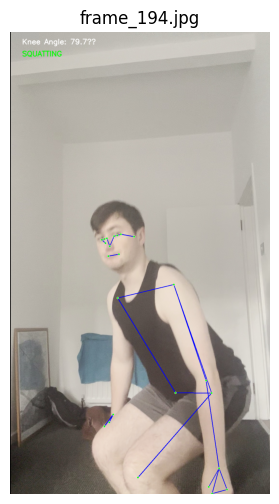

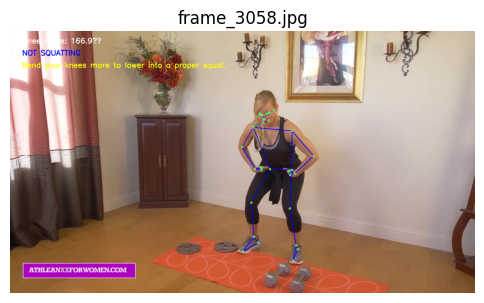

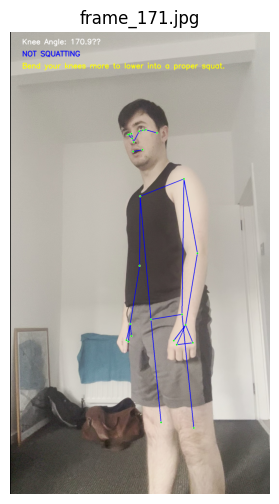

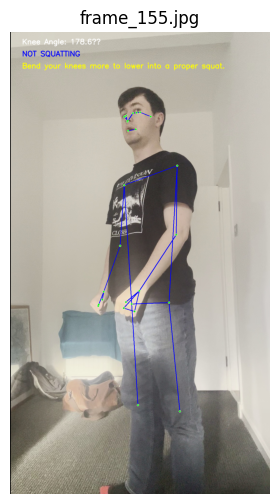

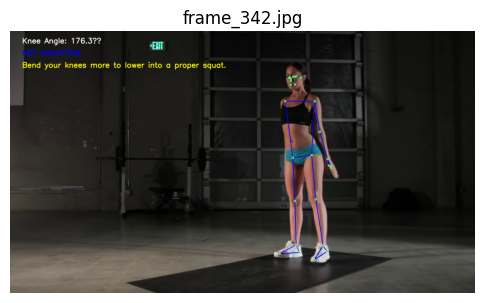

...

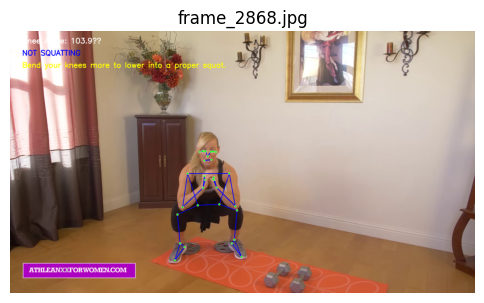

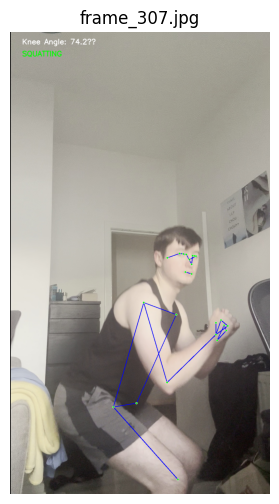

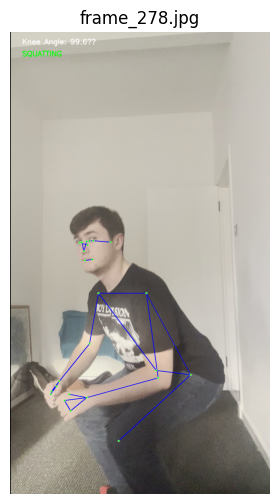

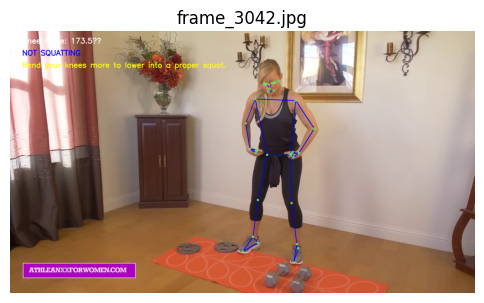

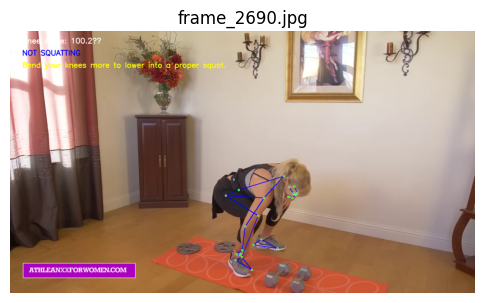

No pose detected in C:\Users\Danie\OneDrive\Desktop\squat images\squat1\frame_305.jpg


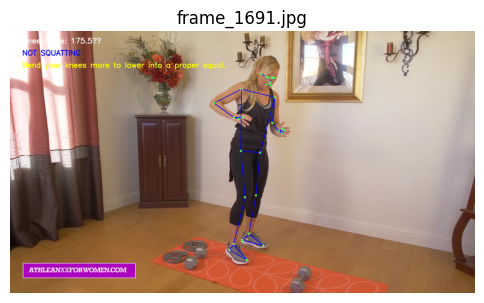

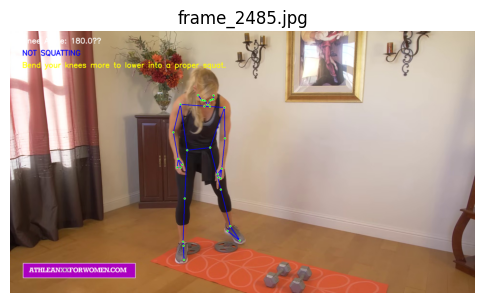

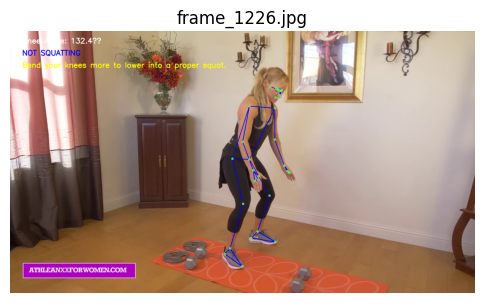

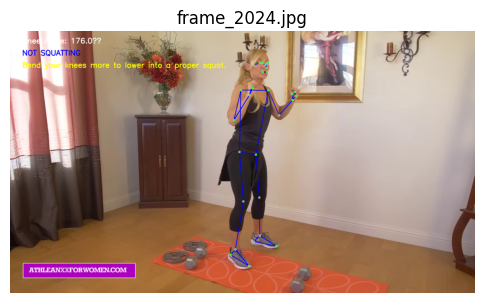

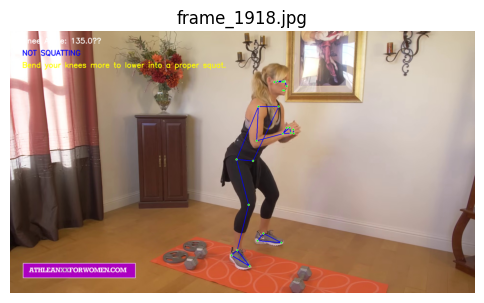

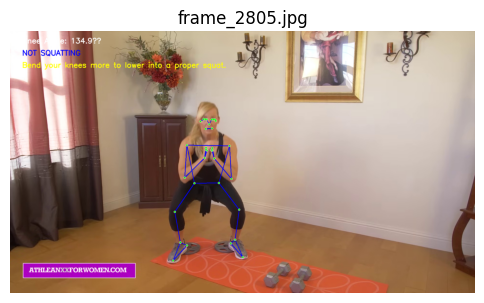

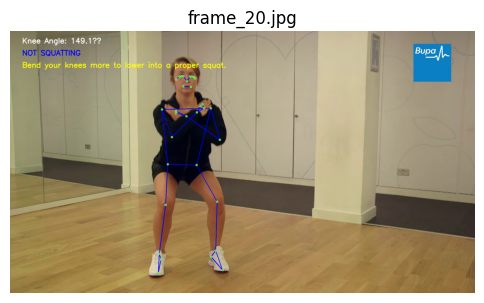

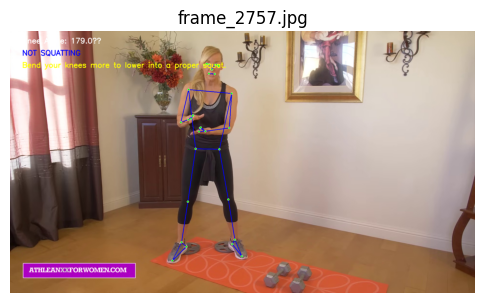

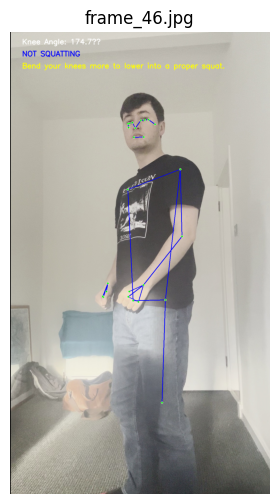

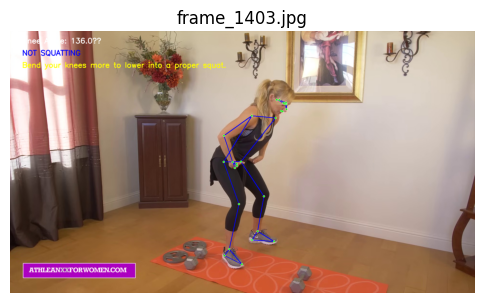

,frame_path,squatting,knee_angle,feedback
0,C:\Users\Danie\OneDrive\Desktop\squat images\2...,True,79.705948,
1,C:\Users\Danie\OneDrive\Desktop\squat images\s...,False,166.905294,Bend your knees more to lower into a proper sq...
2,C:\Users\Danie\OneDrive\Desktop\squat images\2...,False,170.865294,Bend your knees more to lower into a proper sq...
3,C:\Users\Danie\OneDrive\Desktop\squat images\2...,False,178.642365,Bend your knees more to lower into a proper sq...
4,C:\Users\Danie\OneDrive\Desktop\squat images\E...,False,176.325533,Bend your knees more to lower into a proper sq...
5,C:\Users\Danie\OneDrive\Desktop\squat images\s...,False,179.125570,Bend your knees more to lower into a proper sq...
6,C:\Users\Danie\OneDrive\Desktop\squat images\s...,False,178.149008,Bend your knees more to lower into a proper sq...
7,C:\Users\Danie\OneDrive\Desktop\squat images\s...,False,111.259205,Bend your knees more to lower into a proper sq...
8,C:\Users\Danie\OneDrive\Desktop\squat images\s...,False,178.072946,Bend your knees more to lower into a proper sq...
9,C:\Users\Danie\OneDrive\Desktop\squat images\E...,True,72.163215,


In [5]:
frame_paths = glob.glob(os.path.join(images_folder, '**', '*.jpg'), recursive=True)
if len(frame_paths) == 0:
    print("No images found.")
else:
    sample_frames = random.sample(frame_paths, min(NUM_SAMPLE_FRAMES, len(frame_paths)))
    results_data = []

    for frame_path in sample_frames:
        image_bgr = cv2.imread(frame_path)
        if image_bgr is None:
            print(f"Failed to load {frame_path}")
            continue

        image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
        res = pose.process(image_rgb)

        if not res.pose_landmarks:
            print(f"No pose detected in {frame_path}")
            continue

        h, w, c = image_rgb.shape
        landmarks = []
        for lm in res.pose_landmarks.landmark:
            x = lm.x * w
            y = lm.y * h
            z = lm.z
            visibility = lm.visibility
            landmarks.append({'x': x, 'y': y, 'z': z, 'visibility': visibility})

        squat_bool, knee_angle = is_squatting(landmarks, threshold=KNEE_ANGLE_THRESHOLD)

        # If not squatting, give feedback
        feedback_text = None
        if not squat_bool:
            feedback_text = give_feedback(landmarks, knee_angle, threshold=KNEE_ANGLE_THRESHOLD)

        annotated_image = draw_landmarks_angle_feedback(image_rgb, res, knee_angle, squat_bool, feedback=feedback_text)

        # Display in notebook
        plt.figure(figsize=(6,6))
        plt.imshow(annotated_image)
        plt.title(os.path.basename(frame_path))
        plt.axis('off')
        plt.show()

        # Save annotated image
        out_path = os.path.join(ANNOTATED_RESULTS_FOLDER, os.path.basename(frame_path))
        annotated_bgr = cv2.cvtColor(annotated_image, cv2.COLOR_RGB2BGR)
        cv2.imwrite(out_path, annotated_bgr)

        results_data.append({
            'frame_path': frame_path,
            'squatting': squat_bool,
            'knee_angle': knee_angle,
            'feedback': feedback_text if feedback_text else ""
        })

    # Show a summary table
    if results_data:
        results_df = pd.DataFrame(results_data)
        display(results_df)
